In [2]:
from glob import glob
g = glob('*.png')


In [1]:
from IPython.display import clear_output
!pip install tf_explain
clear_output()

In [3]:
pip install tensorflow
#clear_output()

SyntaxError: invalid syntax (2304096281.py, line 1)

In [4]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [5]:
# common
import os
import keras
import numpy as np
import pandas as pd
from glob import glob
import tensorflow as tf
import tensorflow.image as tfi

# Data
from keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical

# Data Viz
import matplotlib.pyplot as plt

# Model 
from keras.models import Model
from keras.layers import Layer
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import UpSampling2D
from keras.layers import concatenate
from keras.layers import Add
from keras.layers import Multiply
from keras.layers import Input
from keras.layers import MaxPool2D
from keras.layers import BatchNormalization

# Callbacks 
from keras.callbacks import Callback
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from tf_explain.core.grad_cam import GradCAM

# Metrics
from keras.metrics import MeanIoU

### load_image(image, SIZE):

This function takes an image path (image) and an integer size (SIZE) as arguments.
It uses the load_img function to load the image from the given path and converts it to an array using img_to_array.
The image array is then divided by 255 to normalize pixel values to the range [0, 1].
The normalized image array is resized using tfi.resize to the specified size (SIZE, SIZE).
Finally, the resulting resized and normalized image array is rounded to four decimal places and returned.

In [6]:
import numpy as np

In [7]:
def load_image(image, SIZE):
    return np.round(tfi.resize(img_to_array(load_img(image))/255.,(SIZE, SIZE)),4)

### load_images(image_paths, SIZE, mask=False, trim=None):

This function takes a list of image paths (image_paths), an integer size (SIZE), a boolean flag for masking (mask), and an optional trimming value (trim) as arguments.
If trim is provided, the image_paths list is truncated to the first trim elements.
If mask is True, an array of shape (len(image_paths), SIZE, SIZE, 1) is created to store single-channel (grayscale) images. Otherwise, an array of shape (len(image_paths), SIZE, SIZE, 3) is created to store three-channel (RGB) images.
The function then iterates through the image paths and uses the load_image function to load and preprocess each image.
If mask is True, the first channel (grayscale) of the processed image is stored in the corresponding position in the images array. Otherwise, the entire processed image is stored.
The final array of processed images is returned.

In [8]:
def load_images(image_paths, SIZE, mask=False, trim=None):
    if trim is not None:
        image_paths = image_paths[:trim]
    
    if mask:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 1))
    else:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))
    
    for i,image in enumerate(image_paths):
        img = load_image(image,SIZE)
        if mask:
            images[i] = img[:,:,:1]
        else:
            images[i] = img
    
    return images

cmap: color map

alph: adjusting the transparency of the image (default is 1 fully opaque)

In [9]:
def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')

def show_mask(image, mask, cmap=None, alpha=0.4):
    plt.imshow(image)
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    plt.axis('off')

In [10]:
SIZE = 256


In [11]:
root_path = '/Users/tejalpatel/Desktop/Cancer_data/Dataset/'
classes = sorted(os.listdir(root_path))
classes

['.DS_Store', 'benign', 'malignant', 'normal']

### Mask Image

A mask image, in the context of image processing and computer vision, is an image that contains pixel-wise information or annotations indicating certain regions or objects of interest within another image.


The mask image is typically a grayscale image where each pixel value represents a label or category. The most common use of mask images is to represent binary masks, where a pixel is either part of the object of interest (foreground) or not (background). In binary masks:
1. Pixel value 0 or black usually represents the background.
2. Pixel value 255 or white usually represents the foreground or the object of interest.


Mask images can also be multi-class or multi-label, where each pixel can represent one of several classes or labels. In this case, each class may be assigned a specific grayscale value.

In more advanced cases, color images can be used as mask images, where each pixel's color encodes specific information about the object it represents.

In [12]:
single_mask_paths = sorted([sorted(glob(root_path + name + "/*mask.png")) for name in classes])
double_mask_paths = sorted([sorted(glob(root_path + name + "/*mask_1.png")) for name in classes])


1. For each mask image path (path), the line of code below removes the _mask suffix from the filename using the str.replace() method.
2. After obtaining the path to the original image (img_path), it is added to the image_paths list.
3. The original mask image path (path) is added to the mask_paths list as is, without any modifications.

In [13]:
image_paths = []
mask_paths = []
for class_path in single_mask_paths:
    for path in class_path:
        img_path = path.replace('_mask','')
        image_paths.append(img_path)
        mask_paths.append(path)

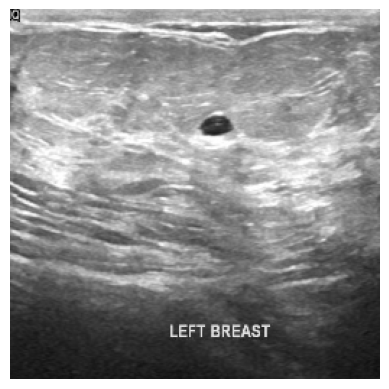

In [14]:
show_image(load_image(image_paths[0], SIZE))

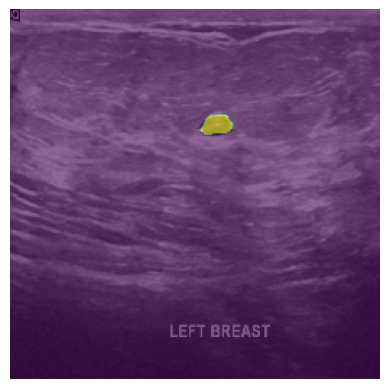

In [15]:
show_mask(load_image(image_paths[0], SIZE), load_image(mask_paths[0], SIZE)[:,:,0], alpha=0.6)

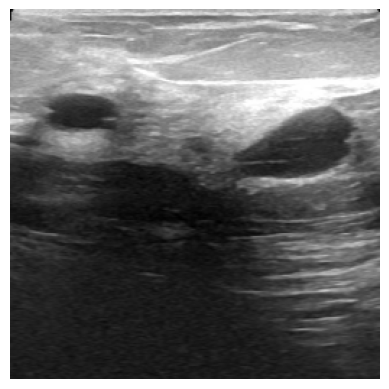

In [16]:
show_image(load_image('/Users/tejalpatel/Desktop/Cancer_data/Dataset/benign/benign (100).png', SIZE))

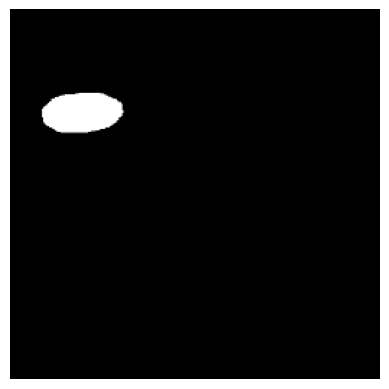

In [17]:
show_image(load_image('/Users/tejalpatel/Desktop/Cancer_data/Dataset/benign/benign (100)_mask_1.png', SIZE))

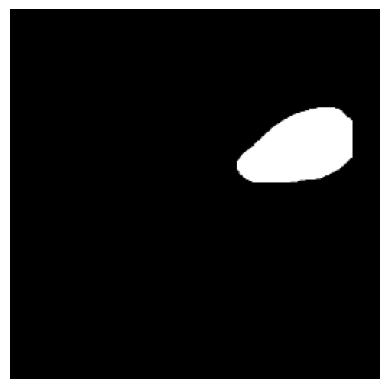

In [18]:
show_image(load_image('/Users/tejalpatel/Desktop/Cancer_data/Dataset/benign/benign (100)_mask.png', SIZE))

Merge both the masked images

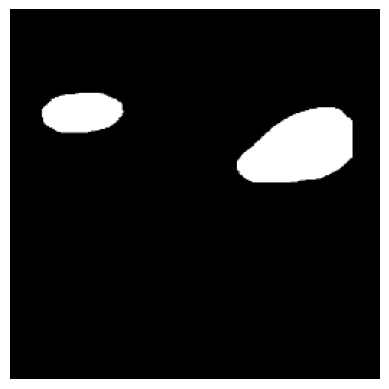

In [19]:
img = np.zeros((1,SIZE,SIZE,3))
mask1 = load_image('/Users/tejalpatel/Desktop/Cancer_data/Dataset/benign/benign (100)_mask_1.png', SIZE)
mask2 = load_image('/Users/tejalpatel/Desktop/Cancer_data/Dataset/benign/benign (100)_mask.png', SIZE)

img = img + mask1 + mask2
img = img[0,:,:,0]
show_image(img, cmap='gray')

### Images as 3D arrays

There are two ways to represent the image data as a three dimensional array. The first involves having the channels as the last or third dimension in the array. This is called “channels last“. The second involves having the channels as the first dimension in the array, called “channels first“.



Channels Last. Image data is represented in a three-dimensional array where the last channel represents the color channels, e.g. [rows][cols][channels].
Channels First. Image data is represented in a three-dimensional array where the first channel represents the color channels, e.g. [channels][rows][cols].

Keras wraps a number of mathematical libraries, and each has a preferred channel ordering. The three main libraries that Keras may wrap and their preferred channel ordering are listed below:

TensorFlow: Channels last order.
Theano: Channels first order.
CNTK: Channels last order.
By default, Keras is configured to use TensorFlow and the channel ordering is also by default channels last.

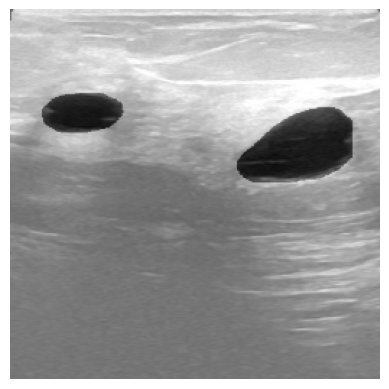

In [20]:
# We first merged them and them simple used the 1st channel

show_image(load_image('/Users/tejalpatel/Desktop/Cancer_data/Dataset/benign/benign (100).png', SIZE))
plt.imshow(img, cmap='binary', alpha=0.4)
plt.axis('off')
plt.show()

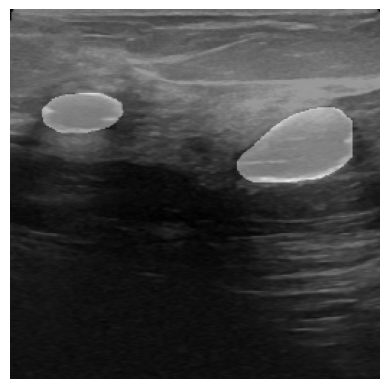

In [21]:
#Grayscale image

show_image(load_image('/Users/tejalpatel/Desktop/Cancer_data/Dataset/benign/benign (100).png', SIZE))
plt.imshow(img, cmap='gray', alpha=0.4)
plt.axis('off')
plt.show()

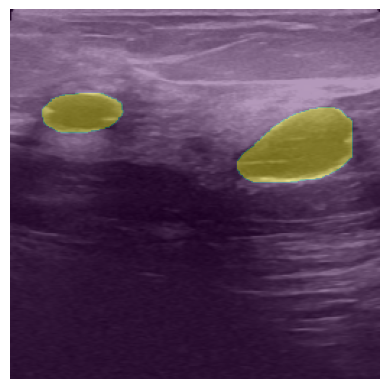

In [22]:
#Color Image

show_image(load_image('/Users/tejalpatel/Desktop/Cancer_data/Dataset/benign/benign (100).png', SIZE))
plt.imshow(img, alpha=0.4)
plt.axis('off')
plt.show()

This is how it looks with different cmaps. But you can drop them as then are very less in number (i.e 16) and this will not affect training much.

# Data Work

In [23]:
images = load_images(image_paths, SIZE)
masks = load_images(mask_paths, SIZE, mask=True)

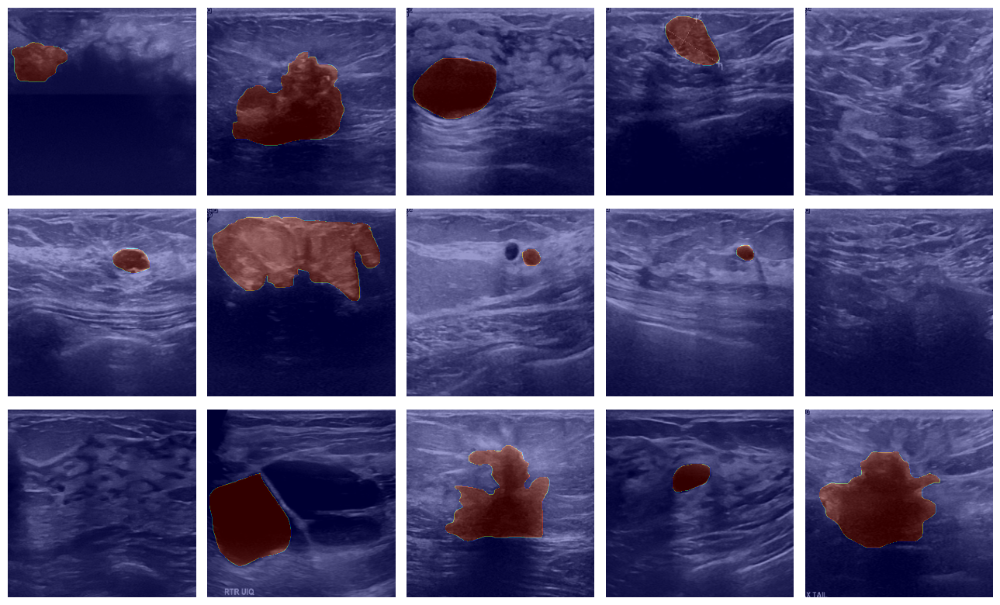

In [24]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='jet')
plt.tight_layout()
plt.show()

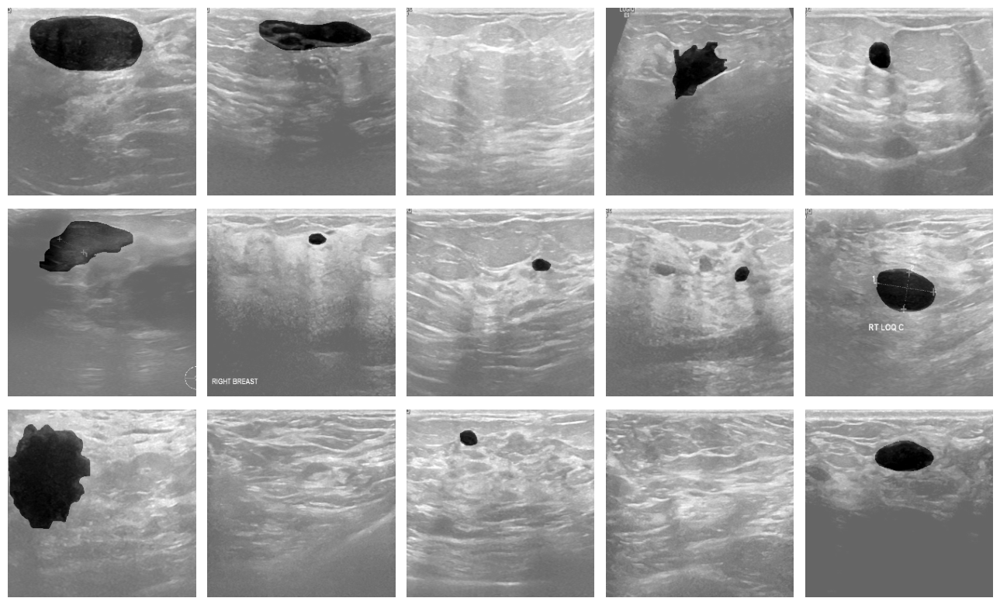

In [25]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='binary')
plt.tight_layout()
plt.show()

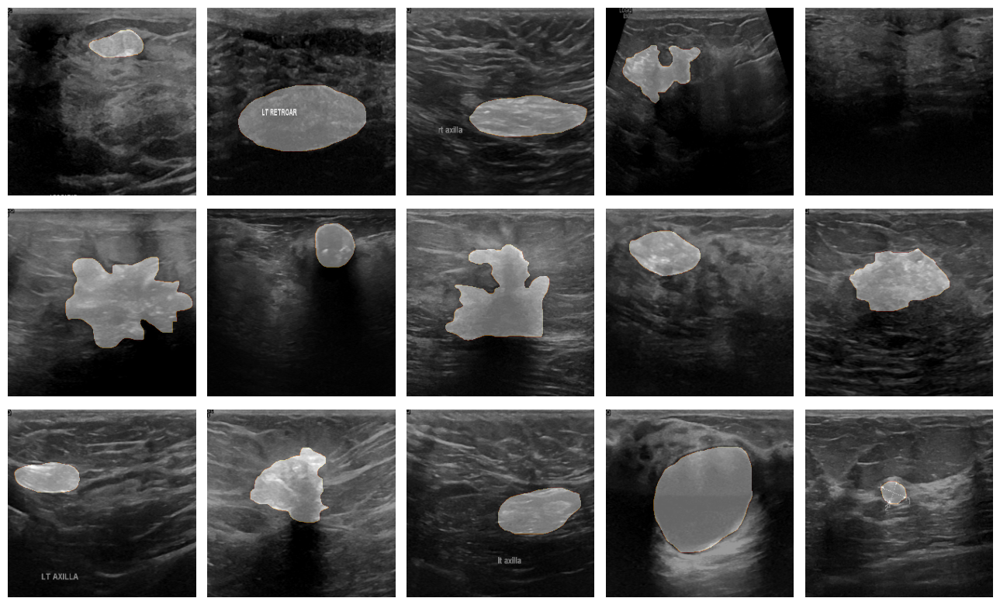

In [26]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='afmhot')
plt.tight_layout()
plt.show()

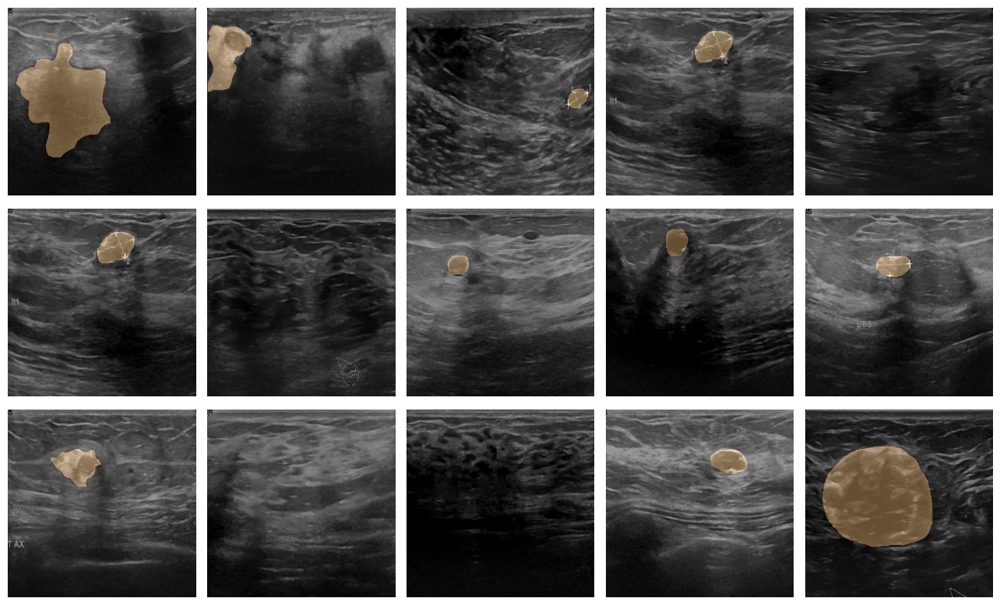

In [27]:
plt.figure(figsize=(13,8))
for i in range(15):
    plt.subplot(3,5,i+1)
    id = np.random.randint(len(images))
    show_mask(images[id], masks[id], cmap='copper')
plt.tight_layout()
plt.show()

# Encoder

In [28]:
class EncoderBlock(Layer):

    def __init__(self, filters, rate, pooling=True, **kwargs):
        super(EncoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate
        self.pooling = pooling

        self.c1 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.drop = Dropout(rate)
        self.c2 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.pool = MaxPool2D()

    def call(self, X):
        x = self.c1(X)
        x = self.drop(x)
        x = self.c2(x)
        if self.pooling:
            y = self.pool(x)
            return y, x
        else:
            return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
            'pooling':self.pooling
        }

# Decoder

In [29]:
class DecoderBlock(Layer):

    def __init__(self, filters, rate, **kwargs):
        super(DecoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate

        self.up = UpSampling2D()
        self.net = EncoderBlock(filters, rate, pooling=False)

    def call(self, X):
        X, skip_X = X
        x = self.up(X)
        c_ = concatenate([x, skip_X])
        x = self.net(c_)
        return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
        }

# Attention Gate

In [30]:
class AttentionGate(Layer):

    def __init__(self, filters, bn, **kwargs):
        super(AttentionGate, self).__init__(**kwargs)

        self.filters = filters
        self.bn = bn

        self.normal = Conv2D(filters, kernel_size=3, padding='same', activation='relu', kernel_initializer='he_normal')
        self.down = Conv2D(filters, kernel_size=3, strides=2, padding='same', activation='relu', kernel_initializer='he_normal')
        self.learn = Conv2D(1, kernel_size=1, padding='same', activation='sigmoid')
        self.resample = UpSampling2D()
        self.BN = BatchNormalization()

    def call(self, X):
        X, skip_X = X

        x = self.normal(X)
        skip = self.down(skip_X)
        x = Add()([x, skip])
        x = self.learn(x)
        x = self.resample(x)
        f = Multiply()([x, skip_X])
        if self.bn:
            return self.BN(f)
        else:
            return f
        # return f

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "bn":self.bn
        }


# Custom Callback

In [31]:
class ShowProgress(Callback):
    def on_epoch_end(self, epochs, logs=None):
        id = np.random.randint(200)
        exp = GradCAM()
        image = images[id]
        mask = masks[id]
        pred_mask = self.model.predict(image[np.newaxis,...])
        cam = exp.explain(
            validation_data=(image[np.newaxis,...], mask),
            class_index=1,
            layer_name='Attention4',
            model=self.model
        )

        plt.figure(figsize=(10,5))

        plt.subplot(1,3,1)
        plt.title("Original Mask")
        show_mask(image, mask, cmap='copper')

        plt.subplot(1,3,2)
        plt.title("Predicted Mask")
        show_mask(image, pred_mask, cmap='copper')

        plt.subplot(1,3,3)
        show_image(cam,title="GradCAM")

        plt.tight_layout()
        plt.show()

# Attention UNet

In [32]:
# Inputs
input_layer = Input(shape=images.shape[-3:])

# Encoder
p1, c1 = EncoderBlock(32,0.1, name="Encoder1")(input_layer)
p2, c2 = EncoderBlock(64,0.1, name="Encoder2")(p1)
p3, c3 = EncoderBlock(128,0.2, name="Encoder3")(p2)
p4, c4 = EncoderBlock(256,0.2, name="Encoder4")(p3)

# Encoding
encoding = EncoderBlock(512,0.3, pooling=False, name="Encoding")(p4)

# Attention + Decoder

a1 = AttentionGate(256, bn=True, name="Attention1")([encoding, c4])
d1 = DecoderBlock(256,0.2, name="Decoder1")([encoding, a1])

a2 = AttentionGate(128, bn=True, name="Attention2")([d1, c3])
d2 = DecoderBlock(128,0.2, name="Decoder2")([d1, a2])

a3 = AttentionGate(64, bn=True, name="Attention3")([d2, c2])
d3 = DecoderBlock(64,0.1, name="Decoder3")([d2, a3])


a4 = AttentionGate(32, bn=True, name="Attention4")([d3, c1])
d4 = DecoderBlock(32,0.1, name="Decoder4")([d3, a4])

# Output 
output_layer = Conv2D(1, kernel_size=1, activation='sigmoid', padding='same')(d4)

# Model
model = Model(
    inputs=[input_layer],
    outputs=[output_layer]
)

# Compile
model.compile(
    loss='binary_crossentropy',
    optimizer='adam',
    metrics=['accuracy', MeanIoU(num_classes=2, name='IoU')]
)

# Callbacks
cb = [
    # EarlyStopping(patience=3, restore_best_weight=True), # With Segmentation I trust on eyes rather than on metrics
    ModelCheckpoint("AttentionCustomUNet.h5", save_best_only=True),
    ShowProgress()
]


# Training

Epoch 1/20
97/97 [==============================] - ETA: 0s - loss: 0.6355 - accuracy: 0.9056 - IoU: 0.4545

/opt/anaconda3/lib/python3.9/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1/1 [==============================] - 0s 229ms/step


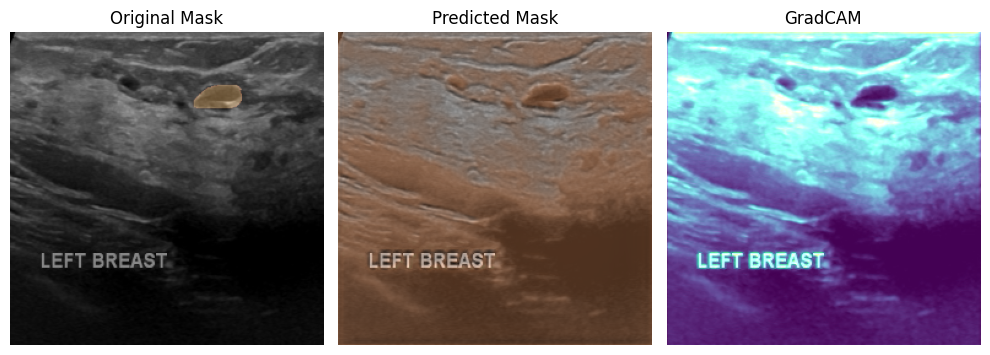

97/97 [==============================] - 297s 3s/step - loss: 0.6355 - accuracy: 0.9056 - IoU: 0.4545 - val_loss: 0.3831 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 2/20
1/1 [==============================] - 0s 106ms/steposs: 0.2197 - accuracy: 0.9166 - IoU: 0.45


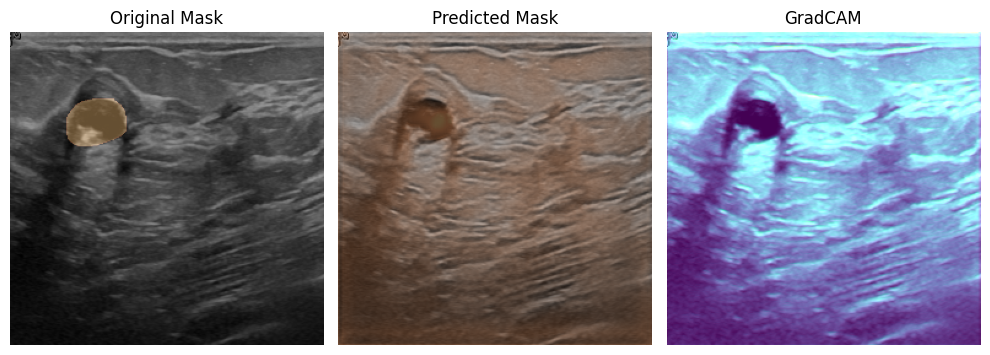

97/97 [==============================] - 277s 3s/step - loss: 0.2197 - accuracy: 0.9166 - IoU: 0.4551 - val_loss: 0.2713 - val_accuracy: 0.9813 - val_IoU: 0.4909
Epoch 3/20
1/1 [==============================] - 0s 106ms/steposs: 0.2056 - accuracy: 0.9217 - IoU: 0.45


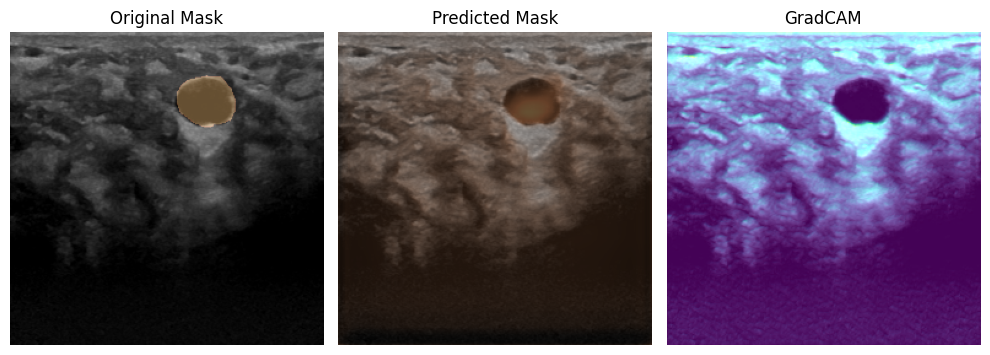

97/97 [==============================] - 267s 3s/step - loss: 0.2056 - accuracy: 0.9217 - IoU: 0.4541 - val_loss: 0.1985 - val_accuracy: 0.9814 - val_IoU: 0.4909
Epoch 4/20
1/1 [==============================] - 0s 144ms/steposs: 0.1954 - accuracy: 0.9268 - IoU: 0.45


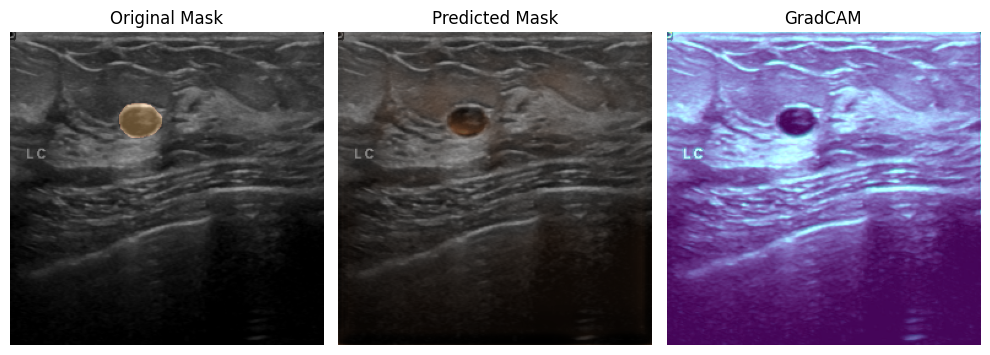

97/97 [==============================] - 291s 3s/step - loss: 0.1954 - accuracy: 0.9268 - IoU: 0.4552 - val_loss: 0.0831 - val_accuracy: 0.9814 - val_IoU: 0.4909
Epoch 5/20
1/1 [==============================] - 0s 135ms/steposs: 0.1862 - accuracy: 0.9314 - IoU: 0.45


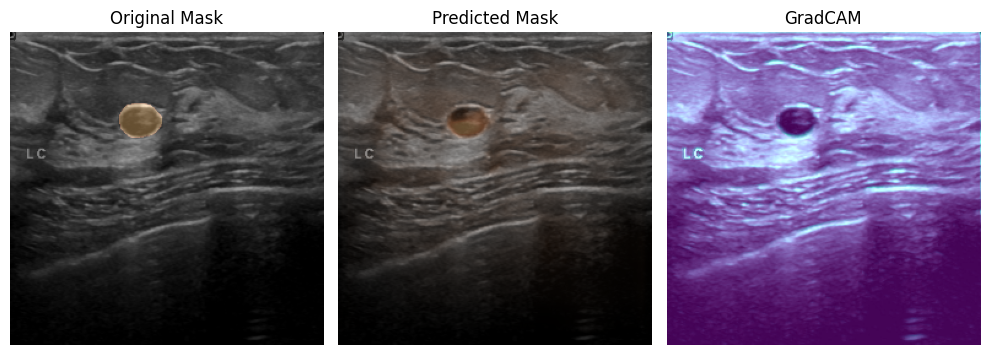

97/97 [==============================] - 327s 3s/step - loss: 0.1862 - accuracy: 0.9314 - IoU: 0.4557 - val_loss: 0.1103 - val_accuracy: 0.9818 - val_IoU: 0.4909
Epoch 6/20
1/1 [==============================] - 0s 131ms/steposs: 0.1804 - accuracy: 0.9327 - IoU: 0.45


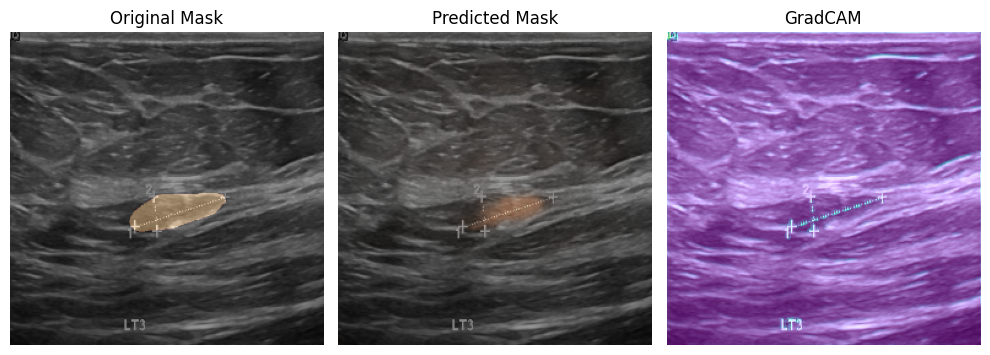

97/97 [==============================] - 325s 3s/step - loss: 0.1804 - accuracy: 0.9327 - IoU: 0.4544 - val_loss: 0.0747 - val_accuracy: 0.9818 - val_IoU: 0.4909
Epoch 7/20
1/1 [==============================] - 0s 123ms/steposs: 0.1813 - accuracy: 0.9321 - IoU: 0.45


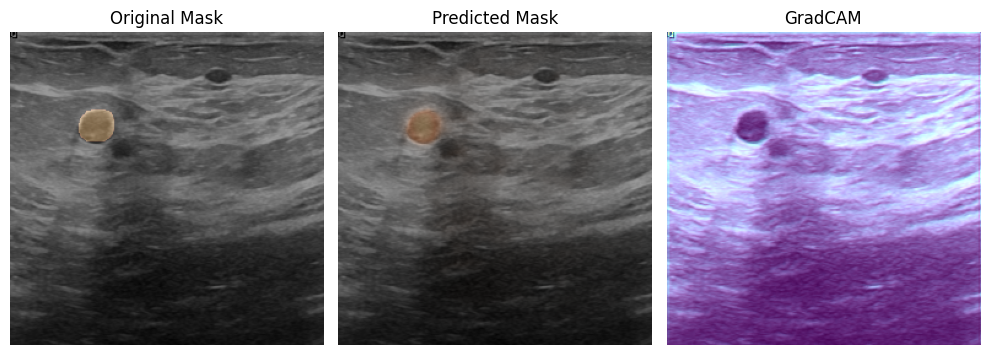

97/97 [==============================] - 320s 3s/step - loss: 0.1813 - accuracy: 0.9321 - IoU: 0.4549 - val_loss: 0.0693 - val_accuracy: 0.9831 - val_IoU: 0.4909
Epoch 8/20
1/1 [==============================] - 0s 126ms/steposs: 0.1729 - accuracy: 0.9379 - IoU: 0.45


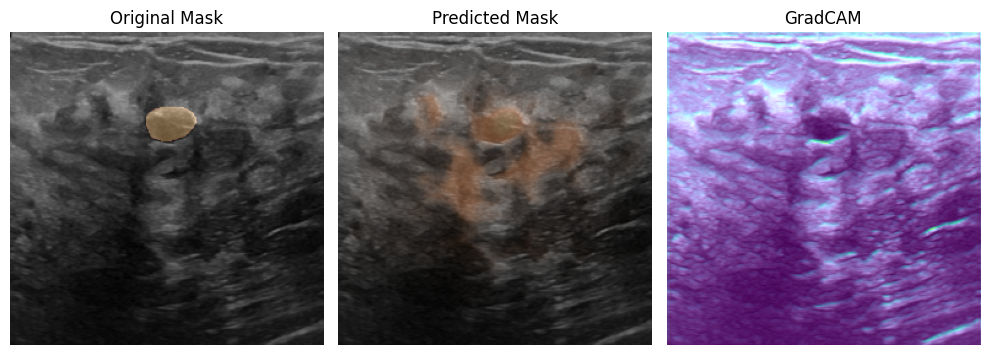

97/97 [==============================] - 292s 3s/step - loss: 0.1729 - accuracy: 0.9379 - IoU: 0.4562 - val_loss: 0.0869 - val_accuracy: 0.9775 - val_IoU: 0.4909
Epoch 9/20
1/1 [==============================] - 0s 114ms/steposs: 0.1658 - accuracy: 0.9387 - IoU: 0.45


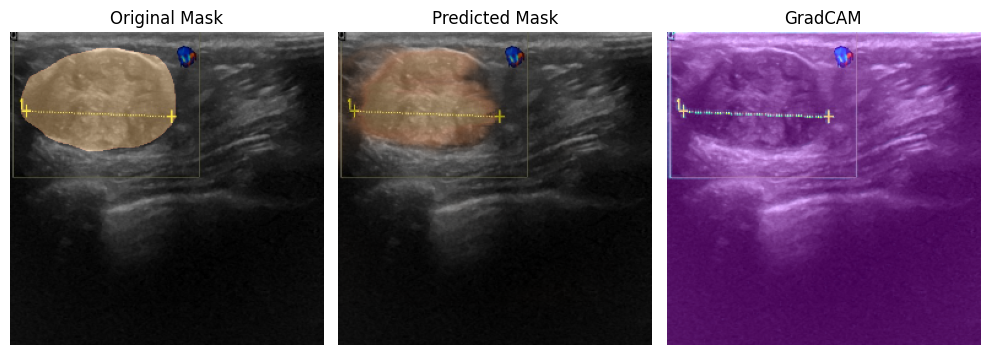

97/97 [==============================] - 287s 3s/step - loss: 0.1658 - accuracy: 0.9387 - IoU: 0.4533 - val_loss: 0.0824 - val_accuracy: 0.9825 - val_IoU: 0.4909
Epoch 10/20
1/1 [==============================] - 0s 155ms/steposs: 0.1593 - accuracy: 0.9419 - IoU: 0.45


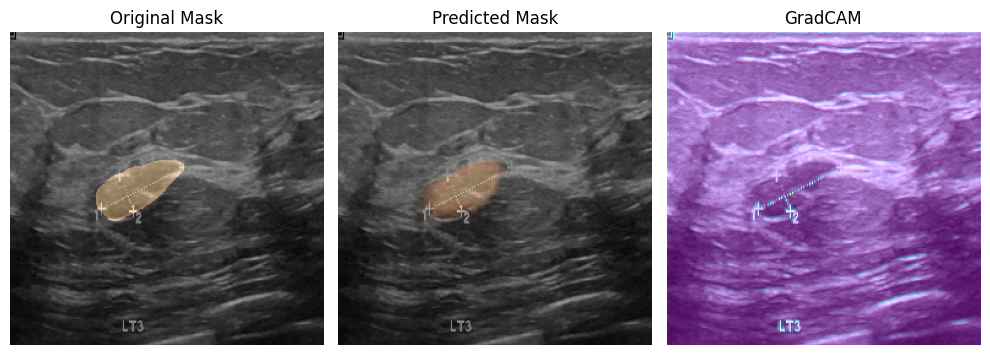

97/97 [==============================] - 276s 3s/step - loss: 0.1593 - accuracy: 0.9419 - IoU: 0.4568 - val_loss: 0.0621 - val_accuracy: 0.9830 - val_IoU: 0.4909
Epoch 11/20
1/1 [==============================] - 0s 115ms/steposs: 0.1550 - accuracy: 0.9423 - IoU: 0.45


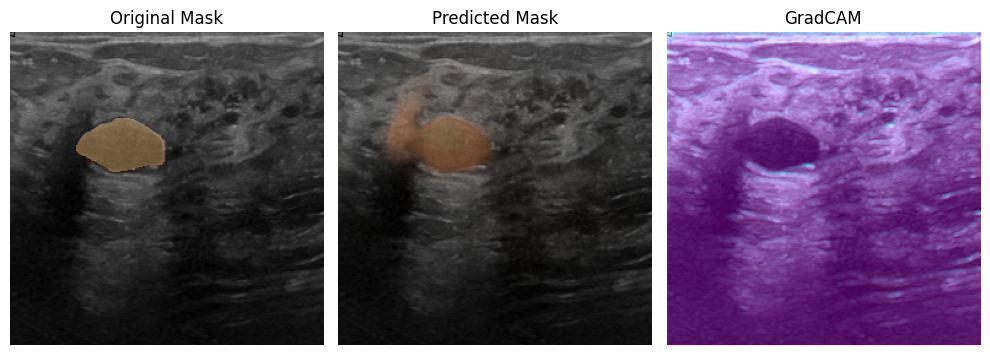

97/97 [==============================] - 299s 3s/step - loss: 0.1550 - accuracy: 0.9423 - IoU: 0.4539 - val_loss: 0.0625 - val_accuracy: 0.9835 - val_IoU: 0.4909
Epoch 12/20
1/1 [==============================] - 0s 110ms/steposs: 0.1453 - accuracy: 0.9458 - IoU: 0.45


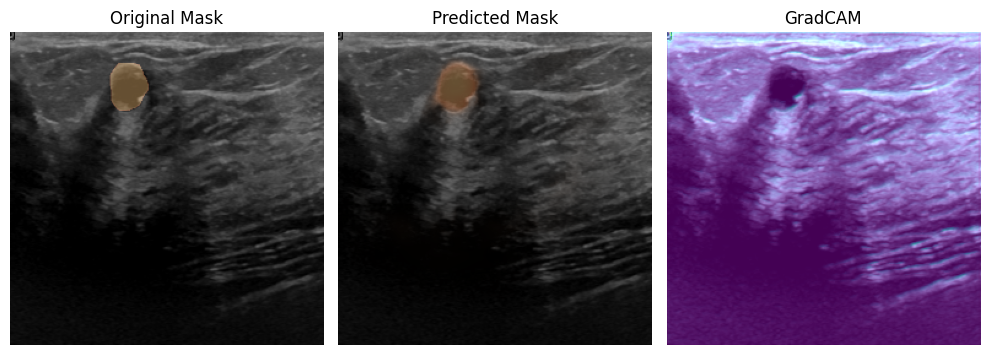

97/97 [==============================] - 283s 3s/step - loss: 0.1453 - accuracy: 0.9458 - IoU: 0.4543 - val_loss: 0.0575 - val_accuracy: 0.9838 - val_IoU: 0.4909
Epoch 13/20
1/1 [==============================] - 0s 147ms/steposs: 0.1397 - accuracy: 0.9486 - IoU: 0.45


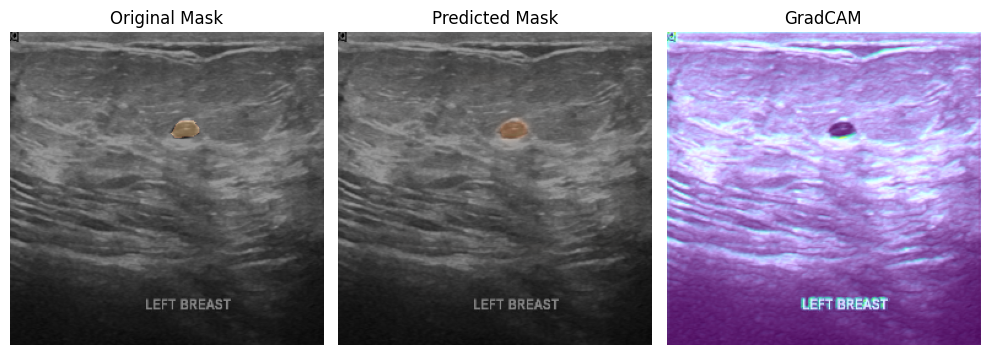

97/97 [==============================] - 288s 3s/step - loss: 0.1397 - accuracy: 0.9486 - IoU: 0.4556 - val_loss: 0.0665 - val_accuracy: 0.9807 - val_IoU: 0.4909
Epoch 14/20
1/1 [==============================] - 0s 110ms/steposs: 0.1370 - accuracy: 0.9503 - IoU: 0.45


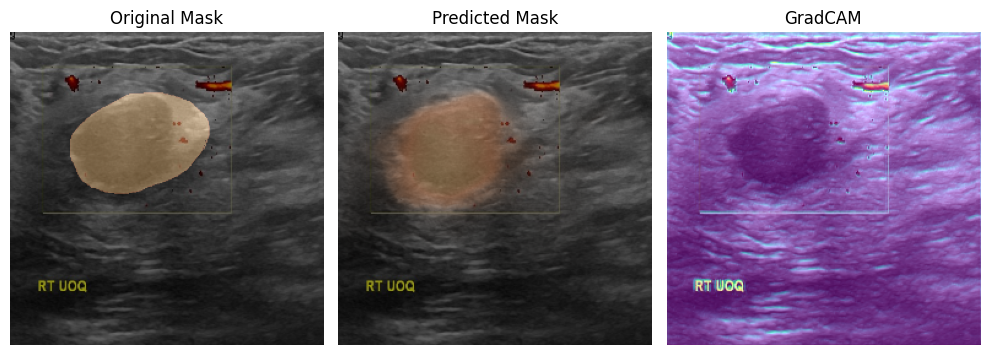

97/97 [==============================] - 285s 3s/step - loss: 0.1370 - accuracy: 0.9503 - IoU: 0.4556 - val_loss: 0.0626 - val_accuracy: 0.9831 - val_IoU: 0.4909
Epoch 15/20
1/1 [==============================] - 0s 126ms/steposs: 0.1384 - accuracy: 0.9481 - IoU: 0.45


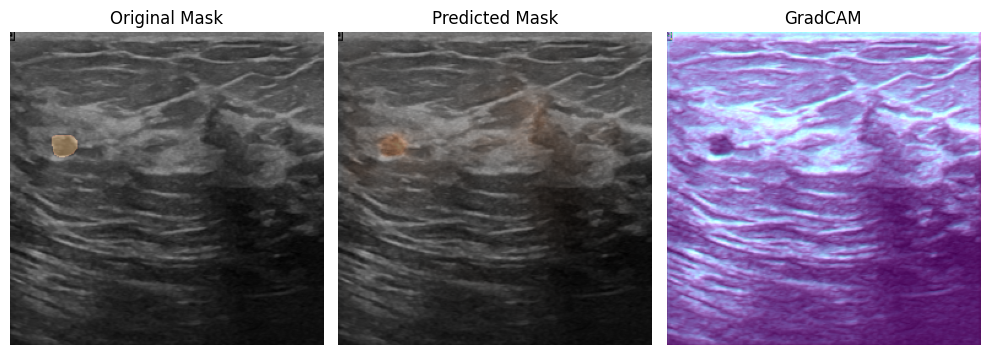

97/97 [==============================] - 294s 3s/step - loss: 0.1384 - accuracy: 0.9481 - IoU: 0.4548 - val_loss: 0.0621 - val_accuracy: 0.9846 - val_IoU: 0.4909
Epoch 16/20
1/1 [==============================] - 0s 110ms/steposs: 0.1260 - accuracy: 0.9528 - IoU: 0.45


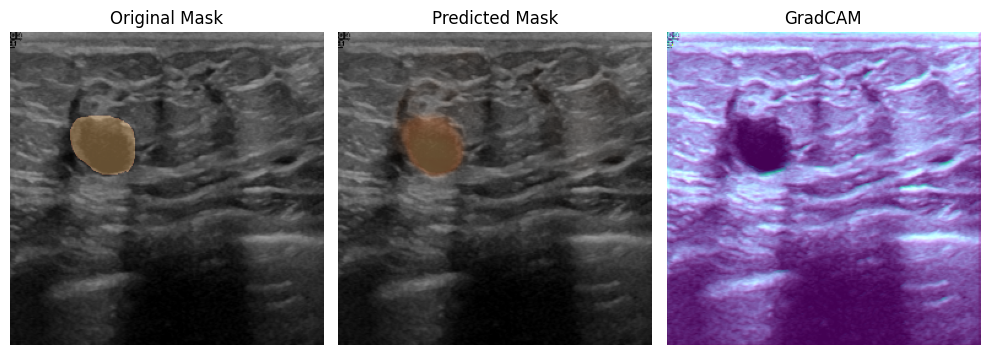

97/97 [==============================] - 291s 3s/step - loss: 0.1260 - accuracy: 0.9528 - IoU: 0.4552 - val_loss: 0.0599 - val_accuracy: 0.9840 - val_IoU: 0.4909
Epoch 17/20
1/1 [==============================] - 0s 118ms/step


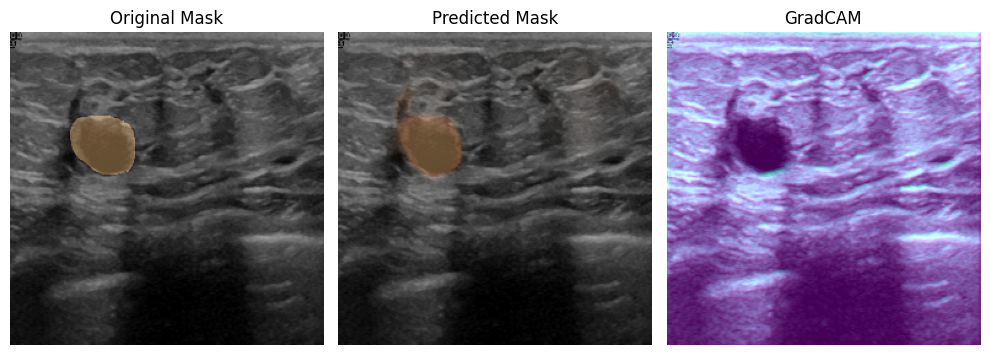

97/97 [==============================] - 50s 484ms/step - loss: 0.1132 - accuracy: 0.9562 - IoU: 0.4578 - val_loss: 0.0647 - val_accuracy: 0.9788 - val_IoU: 0.4912


In [33]:
# Config Training
BATCH_SIZE = 8
SPE = len(images)//BATCH_SIZE

# Training
results = model.fit(
    images, masks,
    validation_split=0.2,
    epochs=20, # 15 will be enough for a good Model for better model go with 20+
    steps_per_epoch=SPE,
    batch_size=BATCH_SIZE,
    callbacks=cb
)

Observations :

1. After 12 epochs model started outputting what we needed.
2. The model was easily able to detect black round spots but fails when the shape is irregular(Not the case with          current model because it is trained with hight SPE).
3. It also gets confused between the dark areas, which makes sense.

Suggestion :

1. Do training in chunks of 20 Epochs, this will give you a good control over model and the model will also perform well.

2. Here the model is trained on 17 + 17 + 17 = 51 Epochs.

3. If you give the model a closer look n different images you will find that the model fails at some images, but I can garantee that 9/10 such images would be so tough that even a human will not be a able to detect as many parts of the image look the same.

# Evaluation

### Loss: 
Training loss. This is a value that indicates how well the model is performing on the training data. It measures the difference between the predicted values and the actual values (ground truth) for the training set.

## Accuracy: 
Training accuracy. This represents the percentage of correctly classified examples in the training dataset. It's a common metric for classification tasks.

## IoU: 
Intersection over Union (IoU). IoU is a metric often used in image segmentation tasks. It measures the overlap between the predicted segmentation mask and the ground truth mask.

## val_loss: 
Validation loss. Similar to the training loss, but calculated using a separate validation dataset. The validation dataset is not used for training and provides an estimate of how well the model generalizes to unseen data.

## val_accuracy: 
Validation accuracy. Similar to training accuracy, but calculated using the validation dataset. It gives an idea of how well the model performs on new, unseen data.

## val_iou: 
Validation IoU. Similar to the IoU metric used for training, but calculated on the validation dataset. It measures the quality of segmentation predictions on the validation data.

In [34]:
loss, accuracy, iou, val_loss, val_accuracy, val_iou = results.history.values()

In [37]:
results.history.values()

dict_values([[0.6355338096618652, 0.21971648931503296, 0.20562487840652466, 0.19536152482032776, 0.18619683384895325, 0.18042361736297607, 0.18129730224609375, 0.1728675365447998, 0.16581909358501434, 0.15928606688976288, 0.15495382249355316, 0.14532150328159332, 0.13972902297973633, 0.13699470460414886, 0.13839533925056458, 0.12603750824928284, 0.1132088452577591], [0.9055852293968201, 0.9165809154510498, 0.921669065952301, 0.9268131852149963, 0.9313679933547974, 0.9327237010002136, 0.932105541229248, 0.9379470944404602, 0.9386615753173828, 0.9418972730636597, 0.9422761797904968, 0.945781409740448, 0.9486052393913269, 0.9502629637718201, 0.9481353759765625, 0.952776312828064, 0.9561896324157715], [0.4544958472251892, 0.45509809255599976, 0.4541470408439636, 0.45520836114883423, 0.4556958079338074, 0.4543878734111786, 0.45489582419395447, 0.45623674988746643, 0.45331913232803345, 0.4567970633506775, 0.453949898481369, 0.45434054732322693, 0.4556140899658203, 0.4555966258049011, 0.45478

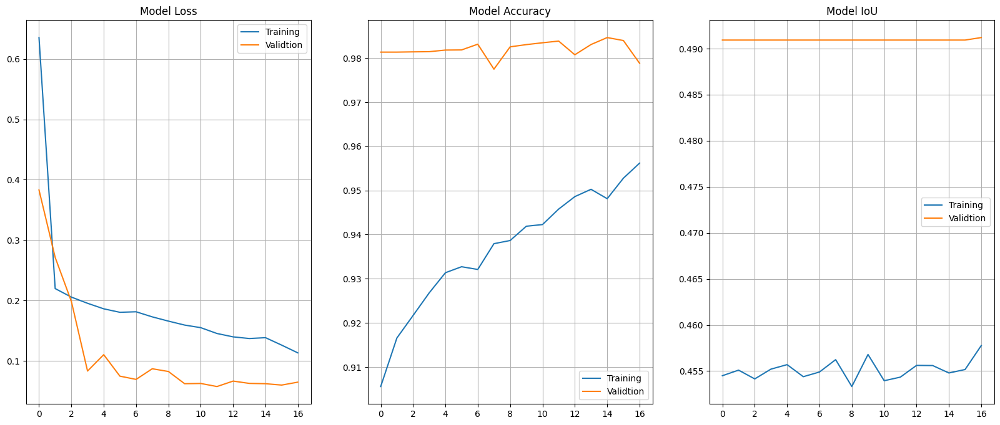

In [35]:
plt.figure(figsize=(20,8))

plt.subplot(1,3,1)
plt.title("Model Loss")
plt.plot(loss, label="Training")
plt.plot(val_loss, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,2)
plt.title("Model Accuracy")
plt.plot(accuracy, label="Training")
plt.plot(val_accuracy, label="Validtion")
plt.legend()
plt.grid()

plt.subplot(1,3,3)
plt.title("Model IoU")
plt.plot(iou, label="Training")
plt.plot(val_iou, label="Validtion")
plt.legend()
plt.grid()

plt.show()

1/1 [==============================] - 0s 107ms/step


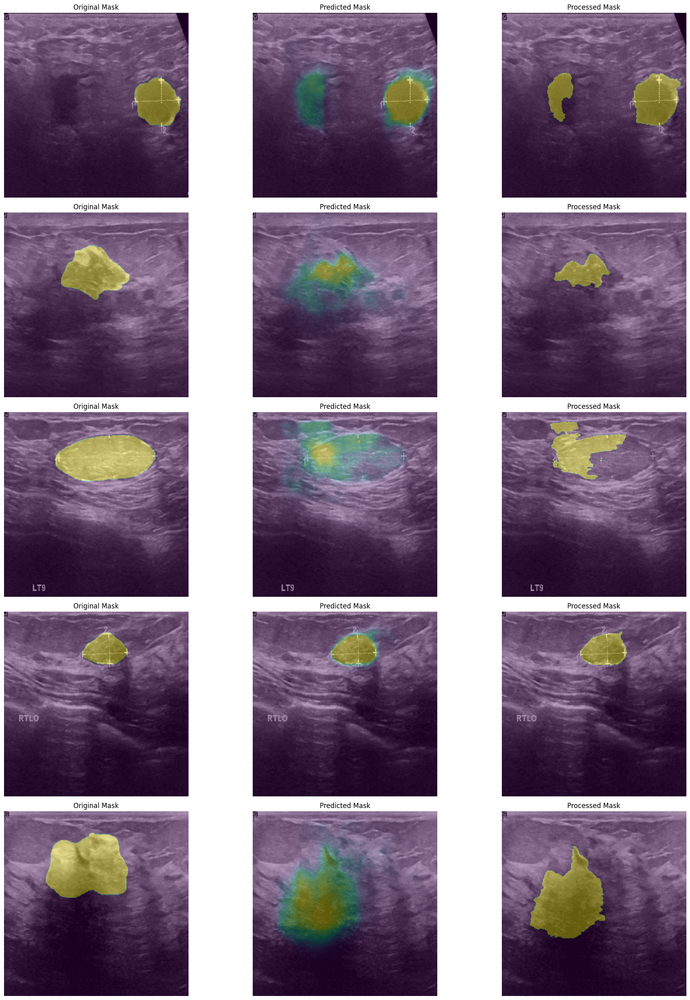

In [36]:
plt.figure(figsize=(20,25))
n=0
for i in range(1,(5*3)+1):
    plt.subplot(5,3,i)
    if n==0:
        id = np.random.randint(len(images))
        image = images[id]
        mask = masks[id]
        pred_mask = model.predict(image[np.newaxis,...])

        plt.title("Original Mask")
        show_mask(image, mask)
        n+=1
    elif n==1:
        plt.title("Predicted Mask")
        show_mask(image, pred_mask)
        n+=1
    elif n==2:
        pred_mask = (pred_mask>0.5).astype('float')
        plt.title("Processed Mask")
        show_mask(image, pred_mask)
        n=0
plt.tight_layout()
plt.show()
